In [1]:
import lasio
import pozo
import pozo.units as pzu
import pozo.themes as pzt


In [2]:
las = lasio.read("./SALADIN.LAS")
#las.curves # I want pretty print!
pzu.check_las(las)


,mnemonic,las unit,pozo mapping,confidence,parsed,description
0,DEPT,M,meter,HIGH,meter,1 Depth
1,DEPT,M,meter,HIGH,meter,2 Measured Depth
2,CALI,CM,centimeter,HIGH,centimeter,3 Caliper Log
3,CGR,GAPI,gAPI,HIGH,gamma_API_unit,4 Computed Gamma-Ray (Thorium + Potassium)
4,DRHO,G/C3,gram / centimeter ** 3,HIGH,gram / centimeter ** 3,5 Density Log Correction
5,DT,US/F,microsecond / foot,HIGH,microsecond / foot,6 Delta T
6,GR,GAPI,gAPI,HIGH,gamma_API_unit,7 Gamma-Ray Log
7,ILD,OHMM,ohm * meter,HIGH,meter * ohm,8 Induction Deep Resistivity
8,ILM,OHMM,ohm * meter,HIGH,meter * ohm,9 Medium Induction Log
9,LLD,OHMM,ohm * meter,HIGH,meter * ohm,10 Laterolog Deep Resistivity


/home/ajp/projects/pozo-py/pozo/graphs.py:70: UserWarning: No yaxis specified and 'DEPTH' not found: using index. Set explicitly with yaxis= OR yaxis_name=. Not sure what y-axis units are.
  warnings.warn("No yaxis specified and 'DEPTH' not found: using index. Set explicitly with yaxis= OR yaxis_name=. Not sure what y-axis units are.")


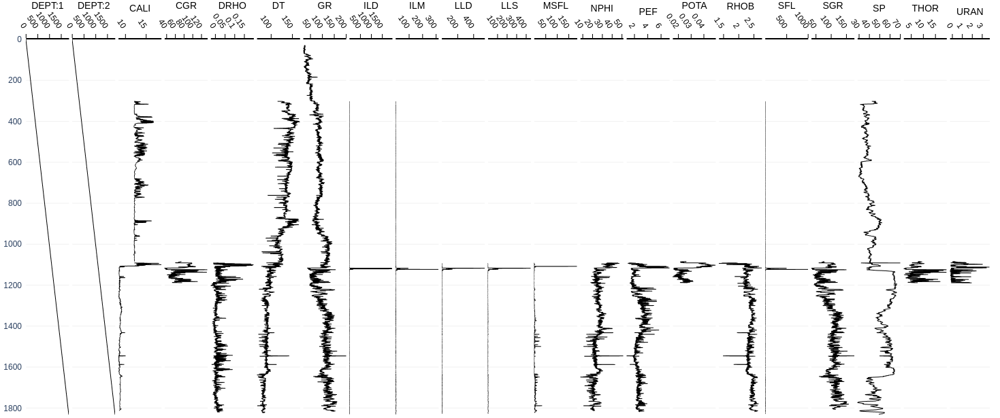

<IPython.core.display.Javascript object>

In [3]:
# Do Basic Checks
# Look at quality
pozo.Graph(las).render(height=600, track_width=80, override_theme={"color":"black"})

In [4]:
include = ["CALI", "CGR", "LLS", "ILM", "ILD", "LLD", "NPHI", "RHOB"]
graph1 = pozo.Graph(las,  yaxis_name="DEPT:2", include=include) 

# Combining CGR CALI
graph1.combine_tracks("CALI", "CGR")

# Combining Conductivities
graph1.combine_tracks("LLD", "LLS", "ILM", "ILD") # does this work for reorder too

# Combining NPHI RHOB
graph1.combine_tracks("RHOB", "NPHI")


In [5]:
cangrejo = {
    "CALI" : {
        "color" : "black",
        "range": [0, 16],
        "range_unit": "inch",
    },
    "CGR" : {
        "color" : "green",
        "range": [0, 150.00],
        "range_unit": "gAPI",
    },
    "LLS" : {
        "color" : "gray",
        "range": [0.2, 2000],
        "scale": "log",
        "range_unit": "ohm * meter",
    },
    "ILM" : {
        "color" : "blue",
        "range": [0.2, 2000],
        "scale": "log",
        "range_unit":  "ohm * meter",
    },
    "ILD" : {
        "color" : "black",
        "range": [0.2, 2000],
        "scale": "log",
        "range_unit":  "ohm * meter",
    },
    "LLD" : {
        "color" : "red",
        "range": [0.2, 2000],
        "scale": "log",
        "range_unit":  "ohm * meter",
    },
    "LLD" : {
        "color" : "red",
        "range": [0.2, 2000],
        "scale": "log",
        "range_unit":  "ohm * meter",
    },
    "LLD" : {
        "color" : "red",
        "range": [0.2, 2000],
        "scale": "log",
        "range_unit": "ohm * meter",
    },
    "NPHI" : {
        "color" : "#008080",
        "range": [0.45, -.15],
        "range_unit": "fraction",
    },
    "RHOB" : {
        "color" : "red",
        "range": [1.95, 2.95],
        "range_unit": "gram/centimeter**3",
    },
}

cangrejo_t = pzt.MnemonicDictionary(cangrejo)

In [10]:
graph1.set_theme(cangrejo_t)
graph1.get_track(0).reorder_all_axes(["CGR", "CALI"])
graph1.get_track(1).reorder_all_axes(["LLD","ILD","ILM","LLS"])
graph1.get_track(1).set_theme({'hidden':False})
graph1.render(height=700, depth_position=1, depth=True)


IndexError: list index out of range

In [7]:
import pozo.renderers as pzr
tree = pzr.TreeTable()

In [8]:
tree.render(graph1)